<a href="https://colab.research.google.com/github/Yumna10/Translation-EDA-Visualization/blob/main/Translation_EDA%26VIS.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**Importing Libraries**

In [57]:
!pip install nltk
!pip install textblob
!python -m textblob.download_corpora
!pip install arabic-reshaper
!pip install python-bidi

[nltk_data] Downloading package brown to /root/nltk_data...
[nltk_data]   Package brown is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package conll2000 to /root/nltk_data...
[nltk_data]   Package conll2000 is already up-to-date!
[nltk_data] Downloading package movie_reviews to /root/nltk_data...
[nltk_data]   Package movie_reviews is already up-to-date!
Finished.


In [58]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import CountVectorizer
import nltk
from nltk.corpus import stopwords
nltk.download('stopwords')
from wordcloud import WordCloud
import plotly.express as px
import plotly.graph_objects as go
from textblob import TextBlob
from plotly.offline import iplot
import arabic_reshaper
from bidi.algorithm import get_display
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


#**Exploratory Data Analysis**

In [59]:
df = pd.read_csv("merge_df (1).csv",encoding="UTF8")
df.head()

,english,arabic
0,Hi.,مرحبًا.
1,Run!,اركض!
2,Help!,النجدة!
3,Jump!,اقفز!
4,Stop!,قف!


In [60]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34912 entries, 0 to 34911
Data columns (total 2 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   english  34912 non-null  object
 1   arabic   34912 non-null  object
dtypes: object(2)
memory usage: 545.6+ KB


In [61]:
df.shape

(34912, 2)

#Calculate and Display the Frequency of Each Unique Value

In [62]:
df['english'].value_counts()

,count
english,
this post is part of our special coverage syria protests.,24
bahrain.,11
digital citizen global voices advox.,11
image from ostagram ru.,10
egypt.,9
...,...
kwa heri see you soon.,1
print it or download it to your devices works fine as flight entertainment.,1
the guide was built collaboratively with the helping hands of deogratias njeri ndesanjo ika christian collins thalia and luis henrique.,1


In [63]:
df['arabic'].value_counts()

,count
arabic,
المواطن الرقمي الاصوات العالمية,11
البحرين,11
الصورة من موقع اوستاغرام الروسي,10
من شركاينا,10
مصر,9
...,...
الاعتداء على كاتبة يمنية بادعاء انها قامت بازدراء الاديان الاصوات العالمية,1
قدم موقع اويجوربيز نت مقال مصور عن بيتزا اويجور في مدينة كاشجر شينجيانج,1
الصين بيتزا اويجور الاصوات العالمية,1


#**Data Visualization**

#Showing the Distribution of Character Lengths

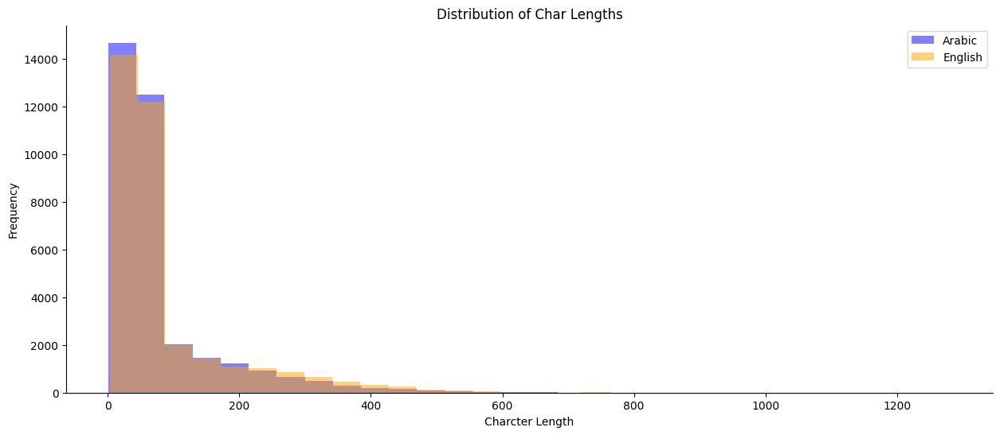

In [64]:
# Drop rows with missing values in the relevant columns
df.dropna(subset=['arabic', 'english'], inplace=True)

plt.figure(figsize=(15, 6))

color_arabic = 'blue'
color_english = 'orange'

plt.hist(df['arabic'].str.len(), bins=30, alpha=0.5, color=color_arabic, label='Arabic')
plt.hist(df['english'].str.len(), bins=30, alpha=0.5, color=color_english, label='English')

plt.gca().spines[['top', 'right']].set_visible(False)
plt.xlabel('Charcter Length')
plt.ylabel('Frequency')
plt.title('Distribution of Char Lengths')
plt.legend()

plt.show()

In [65]:
#adding a column to represent the length of each value
df['len_eng'] = df['arabic'].str.len()
df['len_arb'] = df['english'].str.len()

df.head(10)

,english,arabic,len_eng,len_arb
0,Hi.,مرحبًا.,7,3
1,Run!,اركض!,5,4
2,Help!,النجدة!,7,5
3,Jump!,اقفز!,5,5
4,Stop!,قف!,3,5
5,Go on.,داوم.,5,6
6,Go on.,استمر.,6,6
7,Hello!,مرحباً.,7,6
8,Hurry!,تعجّل!,6,6
9,Hurry!,استعجل!,7,6


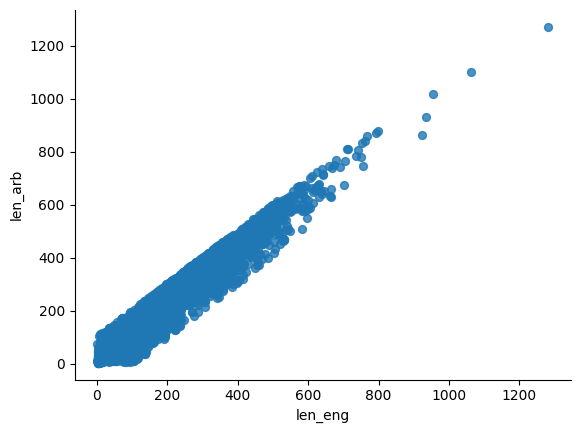

In [66]:
# @title len_eng vs len_arb

df.plot(kind='scatter', x='len_eng', y='len_arb', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

In [67]:
df.drop(columns=['len_arb','len_eng'], inplace=True)

#Displaying the 30 most Frequently Occurring Words

Text(0.5, 1.0, 'Most Frequently Occuring English Words - Top 30')

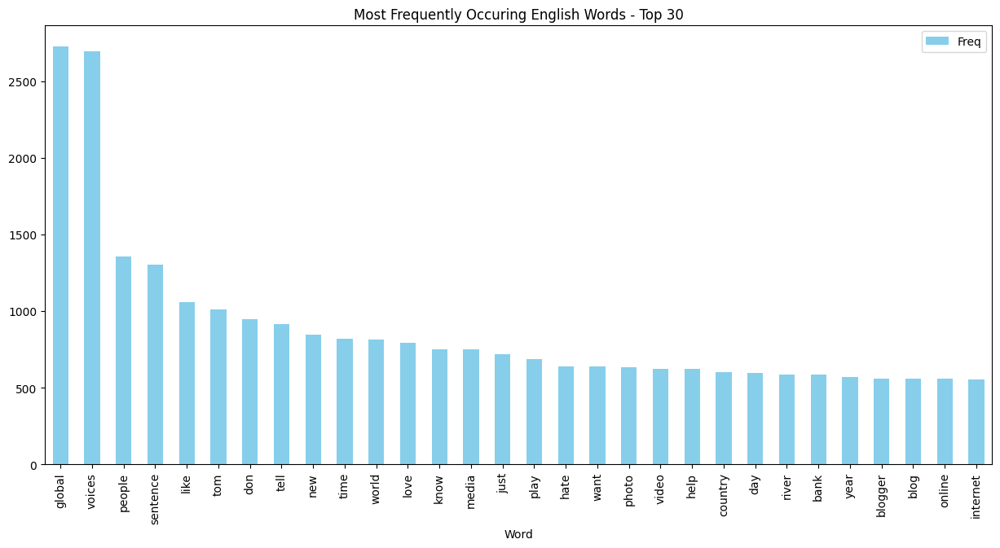

In [68]:
cv1 = CountVectorizer(stop_words = 'english')
words1 = cv1.fit_transform(df.english)

sum_words1 = words1.sum(axis=0)

words_freq1 = [(word1, sum_words1[0, i]) for word1, i in cv1.vocabulary_.items()]
words_freq1 = sorted(words_freq1, key = lambda x: x[1], reverse = True)

frequency1 = pd.DataFrame(words_freq1, columns=['Word', 'Freq'])

frequency1.head(30).plot(x='Word', y='Freq', kind='bar', figsize=(15, 7), color = 'skyblue')
plt.title("Most Frequently Occuring English Words - Top 30")

/usr/local/lib/python3.10/dist-packages/sklearn/feature_extraction/text.py:408: UserWarning:

Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['آمين', 'أب', 'أخ', 'أفعل', 'أفعله', 'ؤلاء', 'إل', 'إم', 'ات', 'اتان', 'ارتد', 'ان', 'انفك', 'برح', 'تان', 'تبد', 'تحو', 'تعل', 'حد', 'حم', 'حي', 'خب', 'ذار', 'سيما', 'صه', 'ظل', 'ظن', 'عد', 'قط', 'مر', 'مكان', 'مكانكن', 'نب', 'هات', 'هب', 'واها', 'وراء'] not in stop_words.



Text(0.5, 1.0, 'Most Frequently Occuring Arabic Words - Top 30')

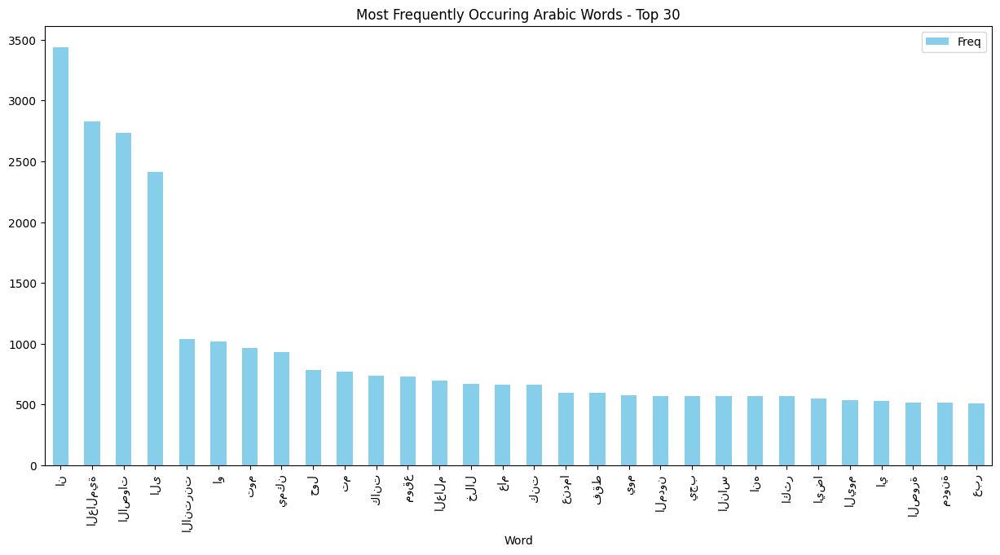

In [69]:
cv2 = CountVectorizer(stop_words=stopwords.words('arabic'))  #Use Arabic stop words from NLTK
words2 = cv2.fit_transform(df.arabic)

sum_words2 = words2.sum(axis=0)

# Use sum_words2 for Arabic vocabulary
words_freq2 = [(word, sum_words2[0, i]) for word, i in cv2.vocabulary_.items()]
words_freq2 = sorted(words_freq2, key = lambda x: x[1], reverse = True)

frequency2 = pd.DataFrame(words_freq2, columns=['Word', 'Freq'])

frequency2.head(30).plot(x='Word', y='Freq', kind='bar', figsize=(15, 7), color = 'skyblue')
plt.title("Most Frequently Occuring Arabic Words - Top 30")

#Word Cloud The Frequency of Words
word cloud is to visually represent the frequency of words in a text dataset. It helps in quickly identifying:

*   Most Common Words: Words that appear more frequently in the dataset are displayed with larger font sizes.

*   Key Themes or Topics: It provides an overview of the vocabulary used in the dataset, highlighting recurring themes or topics.


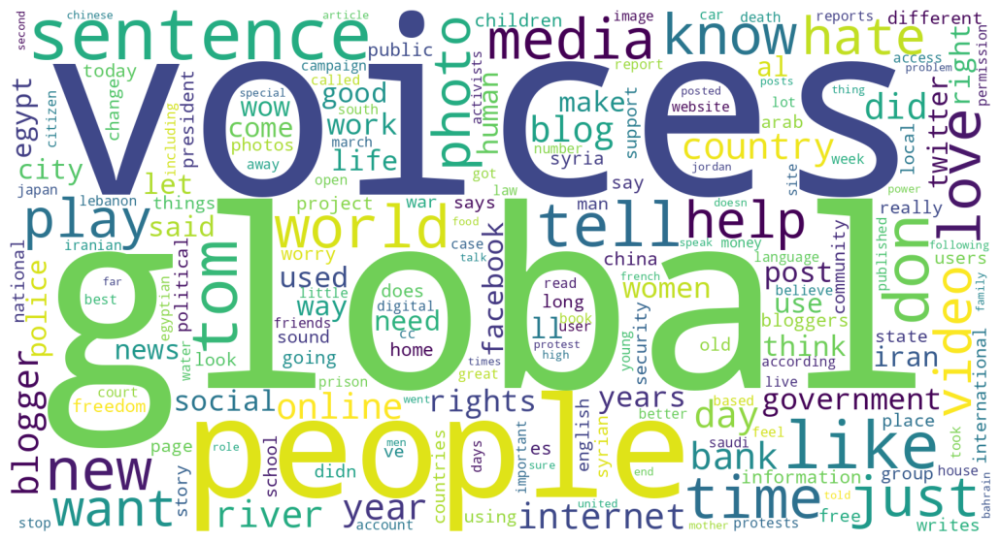

In [70]:
wordcloud1 = WordCloud(background_color = 'white', width = 1500, height = 800).generate_from_frequencies(dict(words_freq1))

plt.figure(figsize=(15,7))
plt.axis('off')
plt.imshow(wordcloud1)

--2024-09-07 17:29:07--  https://noto-website-2.storage.googleapis.com/pkgs/NotoNaskhArabic-unhinted.zip
Resolving noto-website-2.storage.googleapis.com (noto-website-2.storage.googleapis.com)... 64.233.181.207, 173.194.193.207, 173.194.194.207, ...
Connecting to noto-website-2.storage.googleapis.com (noto-website-2.storage.googleapis.com)|64.233.181.207|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 303791 (297K) [application/zip]
Saving to: ‘NotoNaskhArabic-unhinted.zip’

NotoNaskhArabic-unh 100%[===================>] 296.67K  --.-KB/s    in 0.004s  

2024-09-07 17:29:08 (79.1 MB/s) - ‘NotoNaskhArabic-unhinted.zip’ saved [303791/303791]

Archive:  NotoNaskhArabic-unhinted.zip
  inflating: LICENSE_OFL.txt         
  inflating: NotoNaskhArabic-Bold.ttf  
  inflating: NotoNaskhArabic-Regular.ttf  
  inflating: NotoNaskhArabicUI-Bold.ttf  
  inflating: NotoNaskhArabicUI-Regular.ttf  
  inflating: README                  


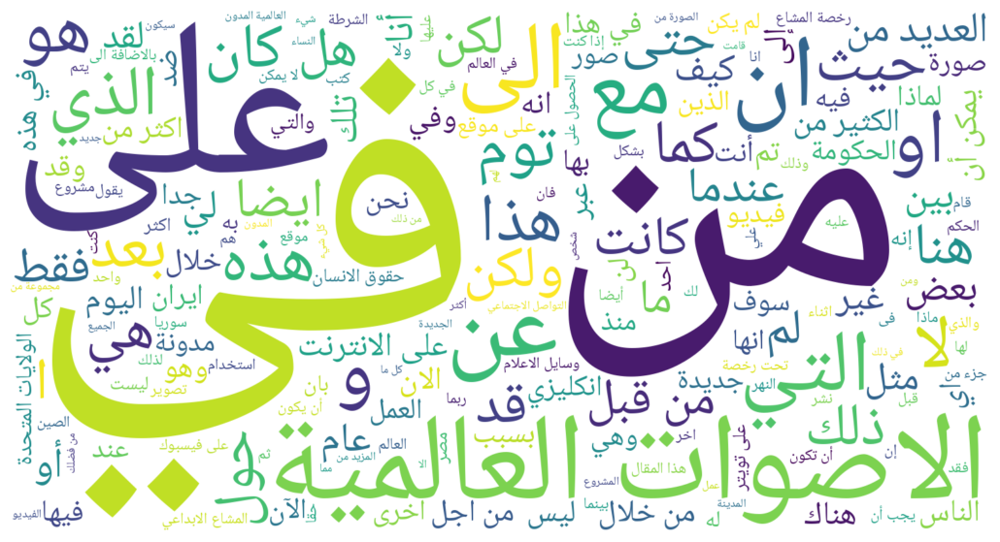

In [71]:
arabic_text = ' '.join(df['arabic'].astype(str))

# Download an Arabic font (Noto Naskh Arabic)
!wget https://noto-website-2.storage.googleapis.com/pkgs/NotoNaskhArabic-unhinted.zip
!unzip NotoNaskhArabic-unhinted.zip

wordcloud_arabic = WordCloud(
    background_color='white',
    width=1500,
    height=800,
    font_path='NotoNaskhArabic-Regular.ttf',  # Path to the downloaded Arabic font
    regexp=r'\w+'  # Match one or more word characters
).generate(arabic_text)

plt.figure(figsize=(15, 7))
plt.imshow(wordcloud_arabic, interpolation='bilinear')
plt.axis('off')
plt.show()

#Distribution of Sentiment Polarity
Sentiment polarity refers to the sentiment or emotional tone expressed in a piece of text, typically in the context of sentiment analysis. It quantifies the positivity or negativity of the sentiment conveyed by the text.

In [72]:
fig = px.histogram(df, x='english', nbins=50, title='Sentiment Polarity Distribution - English')

fig.update_layout(
    xaxis_title='polarity',
    yaxis_title='count',
    title='Sentiment Polarity Distribution - English',
    bargap=0.1,  #gap between bars
    bargroupgap=0.1,  #gap between groups of bars
)
fig.show()

In [73]:
fig = px.histogram(df, x='arabic', nbins=50, title='Sentiment Polarity Distribution - Arabic')

fig.update_layout(
    xaxis_title='polarity',
    yaxis_title='count',
    title='Sentiment Polarity Distribution - Arabic',
    bargap=0.1,  #gap between bars
    bargroupgap=0.1,  #gap between groups of bars
)
fig.show()

#The Top and Bottom 20 Most Frequent Words before Removing Stop Words

In [74]:
def get_top_n_words(corpus, n=None):
    vec = CountVectorizer().fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0)
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]
common_words = get_top_n_words(df['english'], 30)
for word, freq in common_words:
    print(word, freq)
df1 = pd.DataFrame(common_words, columns = ['english' , 'len1'])

df1_sorted = df1.sort_values(by='len1', ascending=False)

fig = go.Figure(data=[go.Bar(x=df1_sorted['english'], y=df1_sorted['len1'], marker=dict(color='orange'))])

fig.update_layout(
    xaxis_title='Word',
    yaxis_title='Count',
    title='Top 30 English words before Removing Stop Words',
)
fig.show()

the 28381
to 15065
of 13219
in 11557
and 11424
is 6670
you 6116
that 5416
for 4761
on 4745
it 4269
this 3972
not 3620
by 3201
with 3170
are 3002
was 2838
from 2786
global 2725
voices 2693
be 2641
as 2561
have 2534
we 2491
he 2433
can 2299
me 2259
at 1942
has 1831
an 1825


In [75]:
def get_bottom_n_words(corpus, n=None):
    vec = CountVectorizer().fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0)
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq = sorted(words_freq, key=lambda x: x[1])
    return words_freq[:n]

bottom_words = get_bottom_n_words(df['english'], 30)

df_bottom = pd.DataFrame(bottom_words, columns=['english', 'len1'])

df_bottom_sorted = df_bottom.sort_values(by='len1', ascending=False)

fig_bottom = go.Figure(data=[go.Bar(x=df_bottom_sorted['english'], y=df_bottom_sorted['len1'], marker=dict(color='orange'))])

fig_bottom.update_layout(
    xaxis_title='Word',
    yaxis_title='Count',
    title='Bottom 20 words before Removing Stop Words',
)
fig_bottom.show()

In [76]:
def get_top_n_words(corpus, n=None):
    vec = CountVectorizer().fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0)
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]
common_words = get_top_n_words(df['arabic'], 30)
for word, freq in common_words:
    print(word, freq)
df1 = pd.DataFrame(common_words, columns = ['arabic' , 'len2'])

df1_sorted = df1.sort_values(by='len2', ascending=False)

fig = go.Figure(data=[go.Bar(x=df1_sorted['arabic'], y=df1_sorted['len2'], marker=dict(color='orange'))])

fig.update_layout(
    xaxis_title='Word',
    yaxis_title='Count',
    title='Top 30 Arabic words before Removing Stop Words',
)
fig.show()

في 15358
من 13246
على 8133
لا 3603
أن 3553
ان 3442
عن 3302
هذا 3077
العالمية 2830
الاصوات 2732
ما 2482
الى 2415
هذه 2278
التي 2148
ذلك 1702
مع 1693
إلى 1619
لم 1548
كان 1431
الذي 1332
هو 1293
كل 1289
أنا 1045
بعد 1044
الانترنت 1039
او 1015
توم 967
يمكن 932
هل 926
قد 890


In [77]:
def get_bottom_n_words(corpus, n=None):
    vec = CountVectorizer().fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0)
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq = sorted(words_freq, key=lambda x: x[1])
    return words_freq[:n]

bottom_words = get_bottom_n_words(df['arabic'], 30)

df_bottom = pd.DataFrame(bottom_words, columns=['arabic', 'len2'])

df_bottom_sorted = df_bottom.sort_values(by='len2', ascending=False)

fig_bottom = go.Figure(data=[go.Bar(x=df_bottom_sorted['arabic'], y=df_bottom_sorted['len2'], marker=dict(color='orange'))])

fig_bottom.update_layout(
    xaxis_title='Word',
    yaxis_title='Count',
    title='Bottom 30 Arabic words before Removing Stop Words',
)
fig_bottom.show()

#The Top 20 Part-of-Speech tags

*   POS tagging involves labeling each word in a text with a grammatical category, such as noun, verb, adjective, etc. This process helps in understanding the syntactic structure of sentences and is fundamental in many NLP tasks, such as information extraction, sentiment analysis, and machine translation.
*   TextBlob simplifies the process of performing POS tagging and other NLP tasks by providing an easy-to-use interface and integration with powerful underlying libraries like NLTK and Pattern.


In [78]:
blob = TextBlob(' '.join(df['english'].astype(str)))

#Extract Part-of-speech tags and create a DataFrame
pos_df = pd.DataFrame(blob.tags, columns=['word', 'pos'])

#Get the count of each Part-of-speech tag
pos_counts = pos_df['pos'].value_counts()[:20]

fig = go.Figure(data=[go.Bar(x=pos_counts.index, y=pos_counts)])

fig.update_layout(
    xaxis_title='POS',
    yaxis_title='Count',
    title='Top 20 Part-Of-Speech Tagging Corpus - English',
)
iplot(fig)

In [79]:
blob = TextBlob(' '.join(df['arabic'].astype(str)))

#Extract Part-of-speech tags and create a DataFrame
pos_df = pd.DataFrame(blob.tags, columns=['word', 'pos'])

#Get the count of each Part-of-speech tag
pos_counts = pos_df['pos'].value_counts()[:20]

fig = go.Figure(data=[go.Bar(x=pos_counts.index, y=pos_counts)])

fig.update_layout(
    xaxis_title='POS',
    yaxis_title='Count',
    title='Top 20 Part-Of-Speech Tagging Corpus - Arabic',
)
iplot(fig)